# 1. Import packages and read data

In [143]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from pandas_profiling import ProfileReport

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import plot_roc_curve

from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, accuracy_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score, roc_auc_score
from sklearn.metrics import average_precision_score, auc, precision_recall_curve
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.ensemble import GradientBoostingClassifier
import lightgbm as lgb
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.cluster import MiniBatchKMeans
from xgboost import XGBClassifier

from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV

In [2]:
df = pd.read_csv('kaggle_datasets/cs-training.csv', index_col=0)
df.head()

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberOfOpenCreditLinesAndLoans,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
1,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
2,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
3,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
4,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
5,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0


# 2. Exploratory analysis
- Use pandas profiling to check descriptive statistics, distribution of values, zero and missing values, correlation between variables.
- Analyse target variable against other discrete/continuous variables

## 2.1 Descriptive statistics, distribution of values, zero and missing values, correlation between vars

In [3]:
prof = ProfileReport(df) 
#prof.to_file(output_file='output/exploratory_analysis.html')

In [4]:
prof

Extra note: If you can't view the output above, I've added a copy into the output folder 'output/exploratory_analysis.html'

### <ins>Initial observations</ins>
From the report generated, some important observations are:

### Target variable class balance
- The target variable 'SeriousDlqin2yrs' is unbalanced with 93.3% negative cases and 6.7% positive cases. This will affect the metrics chosen to assess the models.

### Missing values
- 19.8% of the rows have missing 'MonthlyIncome'. This is quite a large percentage and we are not very sure whether the missing data is random or not random. Deletion of data is not recommended due to the high number of observations, and we would have to find a way to handle these missing cases in the test data. Imputation of data with KNN or mean/median values could be used in the preprocessing step.
- 2.6% of the rows have missing 'NumberOfDependants'. While the no. of affected rows are smaller than 'MonthlyIncome', we can use the same approach to impute the data for missing values in the preprocessing step.

### Skewed variables
- There are quite a few skewed discrete variables but they are mostly logical and not too extreme (e.g. For the number of times borowwer has been late for payment, it is clusted around 0 since most people pay their bills on time)
- 'MonthlyIncome' is very skewed and the range is extremely large. To consider a log transformation.
- Based on the definitions in the data dictionary, there are potential issues with 'DebtRatio' since is calculated based on the 'MonthlyIncome' (which has a lot of missing values), hence it should be corrected.

### Correlation
- Target variable not highly correlated with other variables; correlation observed between the variables indicating no. of times the borrowers are late is expected 



## 2.2 Target variable vs discrete variables

In [22]:
plt.style.use('seaborn-deep')

In [44]:
def cat_vs_target(var, x, y, bins):
    plt.title("Histogram of " + var + " by Target")
    plt.hist([x, y], bins, label=['0', '1'])
    plt.legend(loc='upper right', title = 'SeriousDlqin2yrs')
    plt.xlabel('Frequency')
    plt.ylabel(var)
    plt.xticks(bins, bins)
    plt.show()

### Target variable vs Age

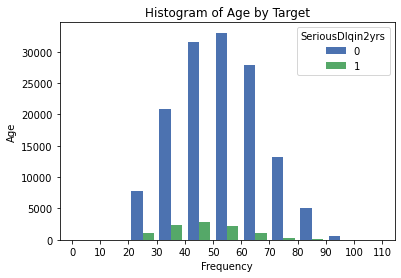

Text(0.5, 1.0, 'Boxplot of Age by Target')

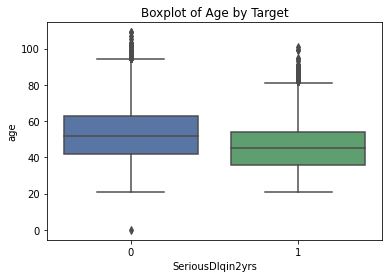

In [74]:
cat_vs_target("Age", df[df.SeriousDlqin2yrs == 0].loc[:,"age"], df[df.SeriousDlqin2yrs == 1].loc[:,"age"], np.arange(0, 120, 10))
sns.boxplot(x="SeriousDlqin2yrs", y="age", data=df).set_title("Boxplot of Age by Target")

Comments: Generally, those who default their loans are of a younger age than those who did not. Majority of defaulters are below 70 years old. We can delete the lone outlier at 0 since it is also unlikely that someone 0 years of age is taking up loans. 

### Target variable vs NumberOfTime30-59DaysPastDueNotWorse

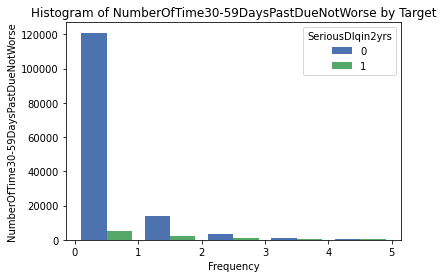

Text(0.5, 1.0, 'Boxplot of NumberOfTime30-59DaysPastDueNotWorse by Target')

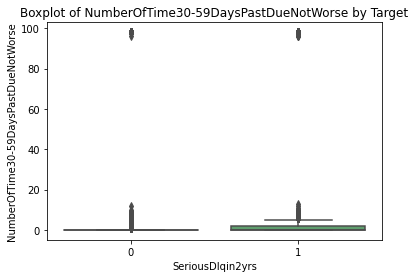

In [119]:
cat_vs_target("NumberOfTime30-59DaysPastDueNotWorse", df[df.SeriousDlqin2yrs == 0].loc[:,"NumberOfTime30-59DaysPastDueNotWorse"], df[df.SeriousDlqin2yrs == 1].loc[:,"NumberOfTime30-59DaysPastDueNotWorse"], np.arange(0, 6, 1))
sns.boxplot(x="SeriousDlqin2yrs", y="NumberOfTime30-59DaysPastDueNotWorse", data=df).set_title("Boxplot of NumberOfTime30-59DaysPastDueNotWorse by Target")

Text(0.5, 1.0, 'Boxplot of NumberOfTime30-59DaysPastDueNotWorse by Target')

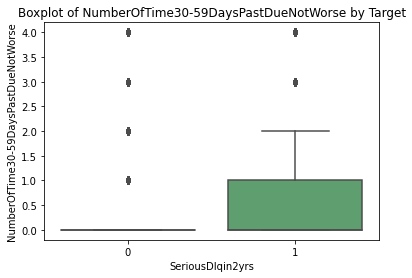

In [124]:
sns.boxplot(x=df[(df.loc[:,"NumberOfTime30-59DaysPastDueNotWorse"] < 5)]["SeriousDlqin2yrs"], y=df[(df.loc[:,"NumberOfTime30-59DaysPastDueNotWorse"] < 5)]["NumberOfTime30-59DaysPastDueNotWorse"]).set_title("Boxplot of NumberOfTime30-59DaysPastDueNotWorse by Target")

Comment: There seems to be 2 major clusters - one is clustered near 100 times for 30-59 days past due; the other is clustered towards <3 times. Those who defaulted on loans tended to have at at least 1 late loans that was past 30-59 days.

### Target variable vs NumberOfTime60-89DaysPastDueNotWorse

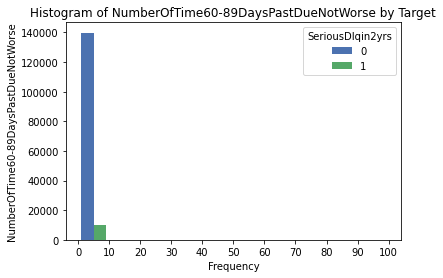

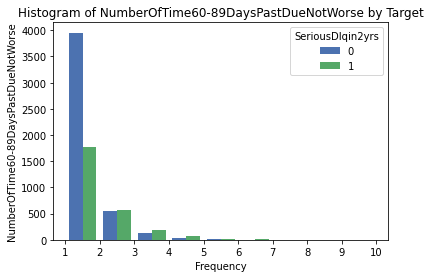

Text(0.5, 1.0, 'Boxplot of NumberOfTime60-89DaysPastDueNotWorse by Target')

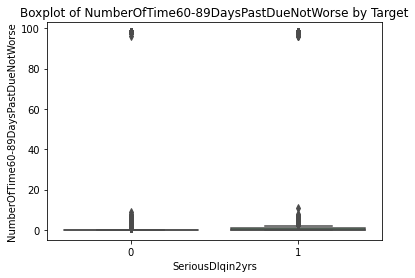

In [129]:
cat_vs_target("NumberOfTime60-89DaysPastDueNotWorse", df[df.SeriousDlqin2yrs == 0].loc[:,"NumberOfTime60-89DaysPastDueNotWorse"], df[df.SeriousDlqin2yrs == 1].loc[:,"NumberOfTime60-89DaysPastDueNotWorse"], np.arange(0, 110, 10))
cat_vs_target("NumberOfTime60-89DaysPastDueNotWorse", df[df.SeriousDlqin2yrs == 0].loc[:,"NumberOfTime60-89DaysPastDueNotWorse"], df[df.SeriousDlqin2yrs == 1].loc[:,"NumberOfTime60-89DaysPastDueNotWorse"], np.arange(1, 11, 1))
sns.boxplot(x="SeriousDlqin2yrs", y="NumberOfTime60-89DaysPastDueNotWorse", data=df).set_title("Boxplot of NumberOfTime60-89DaysPastDueNotWorse by Target")

Text(0.5, 1.0, 'Boxplot of NumberOfTime60-89DaysPastDueNotWorse by Target')

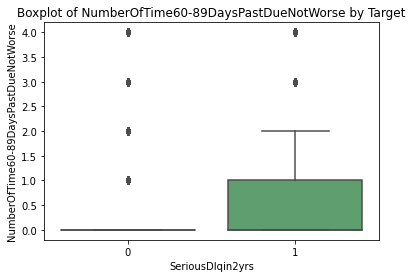

In [125]:
sns.boxplot(x=df[(df.loc[:,"NumberOfTime60-89DaysPastDueNotWorse"] < 5)]["SeriousDlqin2yrs"], y=df[(df.loc[:,"NumberOfTime60-89DaysPastDueNotWorse"] < 5)]["NumberOfTime60-89DaysPastDueNotWorse"]).set_title("Boxplot of NumberOfTime60-89DaysPastDueNotWorse by Target")

Comments: Similar to above, there seems to be 2 major clusters - one is clustered near 100 times for 30-59 days past due; the other is clustered towards <3 times. Those who defaulted on loans tended to have at at least 1 late loans that was past 60-89 days. Those with more than 1 late loan past 60-89 days were more likely to default than not default.

### Target variable vs NumberOfTimes90DaysLate

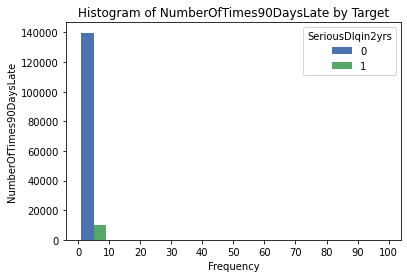

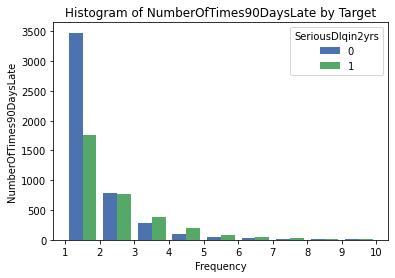

Text(0.5, 1.0, 'Boxplot of NumberOfTimes90DaysLate by Target')

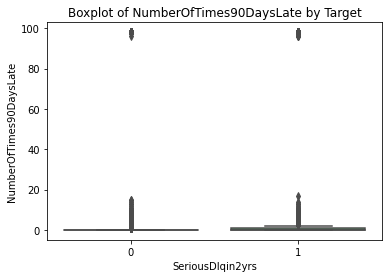

In [79]:
cat_vs_target("NumberOfTimes90DaysLate", df[df.SeriousDlqin2yrs == 0].loc[:,"NumberOfTimes90DaysLate"], df[df.SeriousDlqin2yrs == 1].loc[:,"NumberOfTimes90DaysLate"], np.arange(0, 110, 10))
cat_vs_target("NumberOfTimes90DaysLate", df[df.SeriousDlqin2yrs == 0].loc[:,"NumberOfTimes90DaysLate"], df[df.SeriousDlqin2yrs == 1].loc[:,"NumberOfTimes90DaysLate"], np.arange(1, 11, 1))
sns.boxplot(x="SeriousDlqin2yrs", y="NumberOfTimes90DaysLate", data=df).set_title("Boxplot of NumberOfTimes90DaysLate by Target")

Text(0.5, 1.0, 'Boxplot of NumberOfTimes90DaysLate by Target')

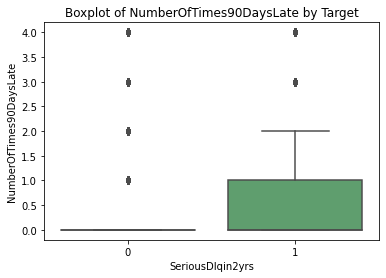

In [126]:
sns.boxplot(x=df[(df.loc[:,"NumberOfTimes90DaysLate"] < 5)]["SeriousDlqin2yrs"], y=df[(df.loc[:,"NumberOfTimes90DaysLate"] < 5)]["NumberOfTimes90DaysLate"]).set_title("Boxplot of NumberOfTimes90DaysLate by Target")

Comments:Comments: Similar to above, there seems to be 2 major clusters - one is clustered near 100 times for >90 days past due; the other is clustered towards <3 times. Those who defaulted on loans tended to have at at least 1 late loans that was past 90 days. Those with more than 2 late loan past 90 days were more likely to default than not default.

### Target variable vs NumberOfOpenCreditLinesAndLoans

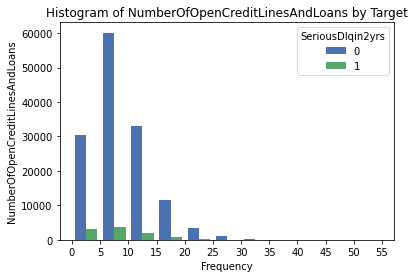

Text(0.5, 1.0, 'Boxplot of NumberOfOpenCreditLinesAndLoans by Target')

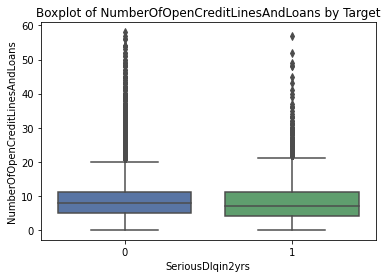

In [80]:
cat_vs_target("NumberOfOpenCreditLinesAndLoans", df[df.SeriousDlqin2yrs == 0].loc[:,"NumberOfOpenCreditLinesAndLoans"], df[df.SeriousDlqin2yrs == 1].loc[:,"NumberOfOpenCreditLinesAndLoans"], np.arange(0, 60, 5))
sns.boxplot(x="SeriousDlqin2yrs", y="NumberOfOpenCreditLinesAndLoans", data=df).set_title("Boxplot of NumberOfOpenCreditLinesAndLoans by Target")

Comments: Those that had defauted usually had a slightly lower number of open credit lines and loans.

### Target variable vs NumberRealEstateLoansOrLines

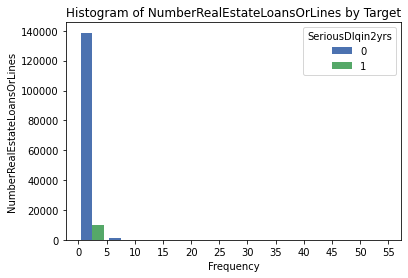

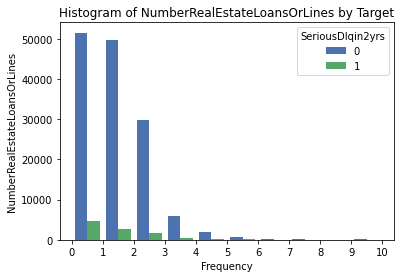

Text(0.5, 1.0, 'Boxplot of NumberRealEstateLoansOrLines by Target')

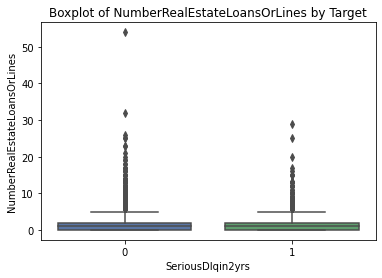

In [81]:
cat_vs_target("NumberRealEstateLoansOrLines", df[df.SeriousDlqin2yrs == 0].loc[:,"NumberRealEstateLoansOrLines"], df[df.SeriousDlqin2yrs == 1].loc[:,"NumberRealEstateLoansOrLines"], np.arange(0, 60, 5))
cat_vs_target("NumberRealEstateLoansOrLines", df[df.SeriousDlqin2yrs == 0].loc[:,"NumberRealEstateLoansOrLines"], df[df.SeriousDlqin2yrs == 1].loc[:,"NumberRealEstateLoansOrLines"], np.arange(0, 11, 1))
sns.boxplot(x="SeriousDlqin2yrs", y="NumberRealEstateLoansOrLines", data=df).set_title("Boxplot of NumberRealEstateLoansOrLines by Target")

Comments: In general, those who defaulted and those who did not had a similar number of real estate loans or lines, with default cases having a very slight lower number of real estate loans or lines. 

### Target variable vs NumberOfDependents

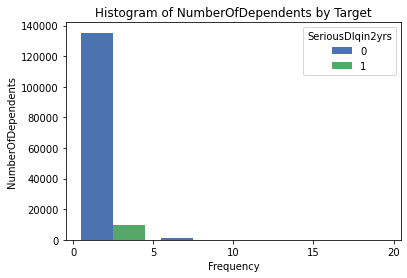

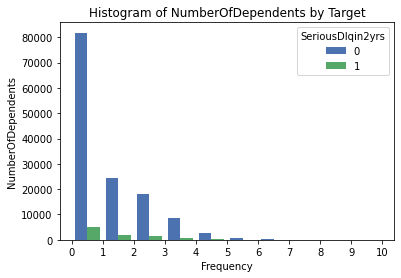

Text(0.5, 1.0, 'Boxplot of NumberOfDependents by Target')

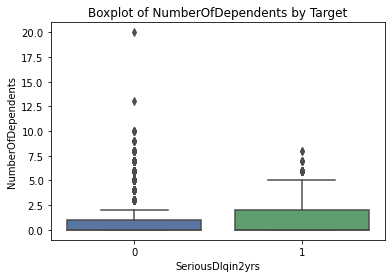

In [82]:
cat_vs_target("NumberOfDependents", df[df.SeriousDlqin2yrs == 0].loc[:,"NumberOfDependents"], df[df.SeriousDlqin2yrs == 1].loc[:,"NumberOfDependents"], np.arange(0, 25, 5))
cat_vs_target("NumberOfDependents", df[df.SeriousDlqin2yrs == 0].loc[:,"NumberOfDependents"], df[df.SeriousDlqin2yrs == 1].loc[:,"NumberOfDependents"], np.arange(0, 11, 1))
sns.boxplot(x="SeriousDlqin2yrs", y="NumberOfDependents", data=df).set_title("Boxplot of NumberOfDependents by Target")

Comments: Excluding the outliers, those who had defaulted on their loans were more likely to have more dependants.

### 2.3 Target variable against continuous (excl discrete) variables

### Target variable vs Monthly Income

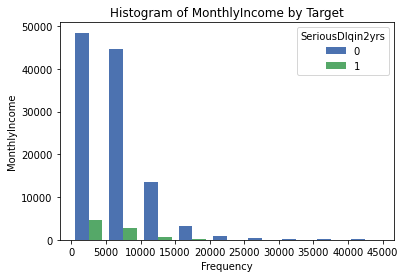

Text(0.5, 1.0, 'Boxplot of MonthlyIncome by Target')

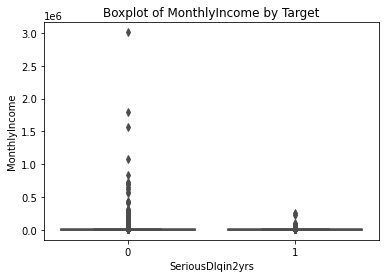

In [105]:
cat_vs_target("MonthlyIncome", df[df.SeriousDlqin2yrs == 0].loc[:,"MonthlyIncome"], df[df.SeriousDlqin2yrs == 1].loc[:,"MonthlyIncome"], np.arange(0, 50000, 5000))
sns.boxplot(x="SeriousDlqin2yrs", y="MonthlyIncome", data=df).set_title("Boxplot of MonthlyIncome by Target")

/Users/alena/anaconda3/lib/python3.6/site-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


Text(0, 0.5, 'log(MonthlyIncome)')

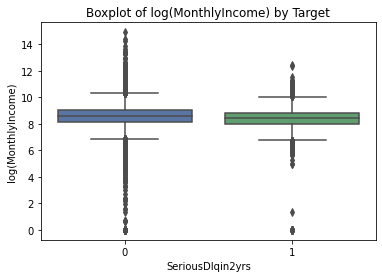

In [102]:
sns.boxplot(x=df["SeriousDlqin2yrs"], y=np.log(df["MonthlyIncome"])).set_title("Boxplot of log(MonthlyIncome) by Target")
plt.ylabel("log(MonthlyIncome)")

Comments: Using a log transformation, we can see that those who defaulted usually had lower monthly income than those who did not. The income distribution for those who defaulted was also narrower. 

### Target variable vs DebtRatio

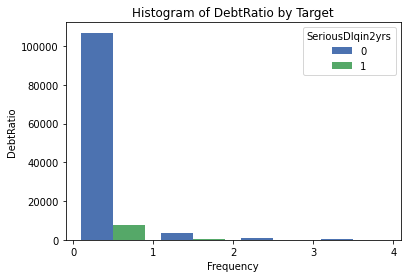

Text(0.5, 1.0, 'Boxplot of DebtRatio by Target')

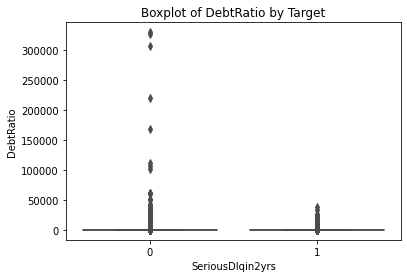

In [96]:
cat_vs_target("DebtRatio", df[df.SeriousDlqin2yrs == 0].loc[:,"DebtRatio"], df[df.SeriousDlqin2yrs == 1].loc[:,"DebtRatio"], np.arange(0, 5, 1))
sns.boxplot(x="SeriousDlqin2yrs", y="DebtRatio", data=df).set_title("Boxplot of DebtRatio by Target")

/Users/alena/anaconda3/lib/python3.6/site-packages/pandas/core/series.py:726: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


Text(0, 0.5, 'log(DebtRatio)')

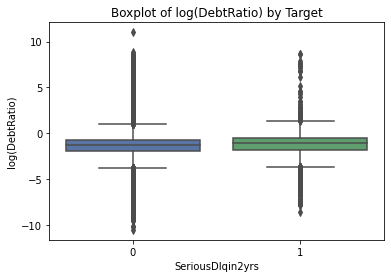

In [111]:
sns.boxplot(x=df[(df.MonthlyIncome > 0)]["SeriousDlqin2yrs"], y=np.log(df[(df.MonthlyIncome > 0)]["DebtRatio"])).set_title("Boxplot of log(DebtRatio) by Target")
plt.ylabel("log(DebtRatio)")

Comments: As mentioned above, the skewness of the debt ratio is related to the lack of information on the monthly income for some observations. If we remove those with 0 or NA for MonthlyIncome and take a log transformation, we see that the debt ratio is usually slightly higher for those who had defaulted.

### Target variable vs RevolvingUtilizationOfUnsecuredLines

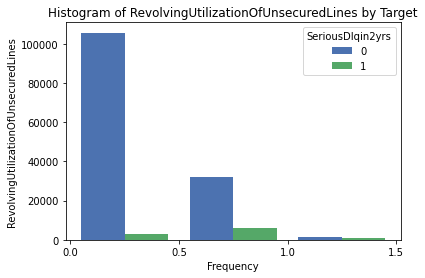

Text(0.5, 1.0, 'Boxplot of RevolvingUtilizationOfUnsecuredLines by Target')

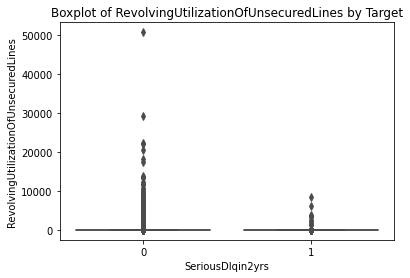

In [131]:
cat_vs_target("RevolvingUtilizationOfUnsecuredLines", df[df.SeriousDlqin2yrs == 0].loc[:,"RevolvingUtilizationOfUnsecuredLines"], df[df.SeriousDlqin2yrs == 1].loc[:,"RevolvingUtilizationOfUnsecuredLines"], np.arange(0, 2, 0.5))
sns.boxplot(x="SeriousDlqin2yrs", y="RevolvingUtilizationOfUnsecuredLines", data=df).set_title("Boxplot of RevolvingUtilizationOfUnsecuredLines by Target")

Text(0.5, 1.0, 'Boxplot of RevolvingUtilizationOfUnsecuredLines by Target')

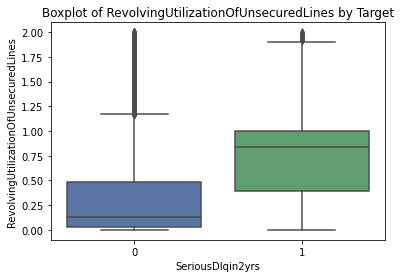

In [118]:
sns.boxplot(x=df[(df.RevolvingUtilizationOfUnsecuredLines < 2)]["SeriousDlqin2yrs"], y=df[(df.RevolvingUtilizationOfUnsecuredLines < 2)]["RevolvingUtilizationOfUnsecuredLines"]).set_title("Boxplot of RevolvingUtilizationOfUnsecuredLines by Target")

Comments: Excluding the outliers and zooming in to the rest of the 99.75% of the data, those who defaulted usually had a higher revolving utilisation of unsecured loans.

# 3. Data preprocessing

### Remove age outlier

In [167]:
df2 = df[df.age > 1]

### Fix missing values using imputation with median values

As mentioned above, the variables with missing values are MonthlyIncome and NumberOfDependants. Since DebtRatio is a function of MonthlyIncome which has missing variables, let us determine the debt first by setting those with MonthlyIncome=0 to MonthlyIncome=1 and then multiplying by the DebtRatio. We can then impute the missing values for MonthlyIncome and recompute the DebtRatio (or simply use the Debt instead of DebtRatio). We will also impute the missing values for NumberOfDependants.

In [168]:
df2['MonthlyIncome'] = df2['MonthlyIncome'].replace(0, 1)
df2['MonthlyIncome_new'] = df2['MonthlyIncome'].fillna(1)
df2['Debt'] = df2['DebtRatio'] * df2['MonthlyIncome_new']
df2['MonthlyIncome'] = df2['MonthlyIncome'].replace(np.nan, df2['MonthlyIncome'].median())
df2['DebtRatio'] = df2['Debt']/df2['MonthlyIncome']

/Users/alena/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/alena/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/alena/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

In [169]:
df2['NumberOfDependents'] = df2['NumberOfDependents'].replace(np.nan, df2['NumberOfDependents'].median())

/Users/alena/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [196]:
df2 = df2.drop(columns=['MonthlyIncome_new'])
df2.isna().sum()

SeriousDlqin2yrs                        0
RevolvingUtilizationOfUnsecuredLines    0
age                                     0
NumberOfTime30-59DaysPastDueNotWorse    0
DebtRatio                               0
MonthlyIncome                           0
NumberOfOpenCreditLinesAndLoans         0
NumberOfTimes90DaysLate                 0
NumberRealEstateLoansOrLines            0
NumberOfTime60-89DaysPastDueNotWorse    0
NumberOfDependents                      0
Debt                                    0
dtype: int64

# 4. Model selection

### Preparing training and testing data

In [197]:
y = df2.SeriousDlqin2yrs
X = df2.drop(columns=["SeriousDlqin2yrs"])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

### Testing a few common baseline models that are easily interpretable and can handle unbalanced target variable

/Users/alena/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/Users/alena/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.h

Boxplot of AUCs


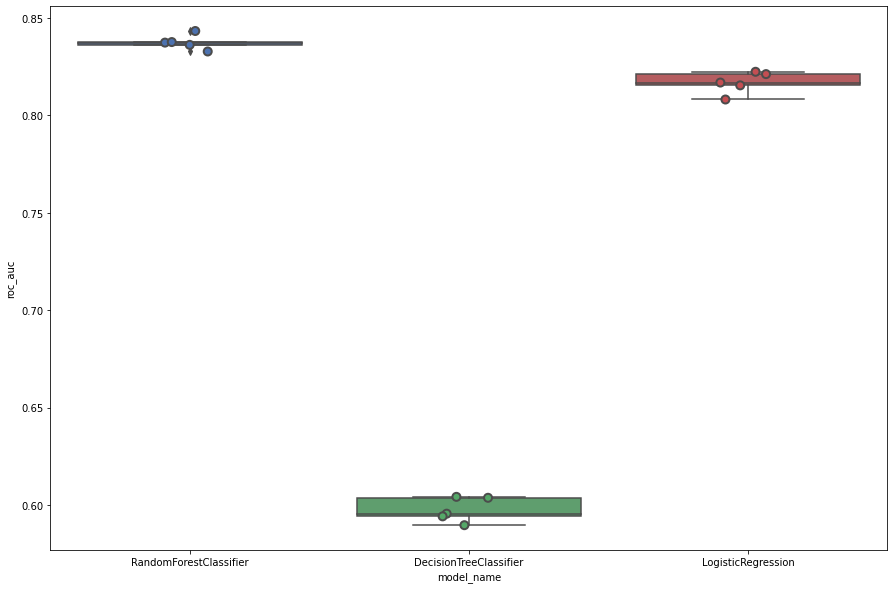

In [198]:
models = [
    RandomForestClassifier(class_weight='balanced'),
    DecisionTreeClassifier(class_weight='balanced'),
    LogisticRegression(class_weight='balanced'),
]
cv_df = pd.DataFrame(index=range(5 * len(models)))
entries = []
for model in models:
  model_name = model.__class__.__name__
  roc_aucs = cross_val_score(model, X_train, y_train, scoring='roc_auc', cv=5)
  for fold_idx, roc_auc in enumerate(roc_aucs):
    entries.append((model_name, fold_idx, roc_auc))
cv_df = pd.DataFrame(entries, columns=['model_name', 'fold_idx', 'roc_auc'])

fig, ax = plt.subplots(figsize=(15,10))
sns.boxplot(x='model_name', y='roc_auc', data=cv_df)
sns.stripplot(x='model_name', y='roc_auc', data=cv_df, 
              size=8, jitter=True, edgecolor="gray", linewidth=2)
print('Boxplot of AUCs')
plt.show()

In [199]:
#Random Forest
cv_df.roc_auc[:5].mean()

0.8373743067931902

In [200]:
#Decision Tree
cv_df.roc_auc[5:10].mean()

0.597440550499056

In [201]:
#Logistic Regression
cv_df.roc_auc[10:15].mean()

0.8167148495048675

Comments: From the training cross-validation baseline models without tuning, the Random Forest model performed best. We would want to focus on it if the test set produces the same result.

#### Baseline models on test set

In [202]:
#Random Forest
rf_clf = models[0]
rf_clf.fit(X_train, y_train)
pred = rf_clf.predict_proba(X_test)
roc_auc = roc_auc_score(y_test, pred[:, 1])
print(roc_auc)

0.8418601583996692


In [203]:
#Decision Tree
dt_clf = models[1]
dt_clf.fit(X_train, y_train)
pred = dt_clf.predict_proba(X_test)
roc_auc = roc_auc_score(y_test, pred[:, 1])
print(roc_auc)

0.6093248326866633


In [204]:
#Logistic regression
lr_clf = models[2]
lr_clf.fit(X_train, y_train)
pred = lr_clf.predict_proba(X_test)
roc_auc = roc_auc_score(y_test, pred[:, 1])
print(roc_auc)

0.8161108832504733


Comments: Since Random Forest has produced the best results (in terms of AUC) among the 3 models for the cross-validation on the training set and on the test set, we will focus on using that for further parameter tuning.

#### Feature importances for Random Forest model

<AxesSubplot:>

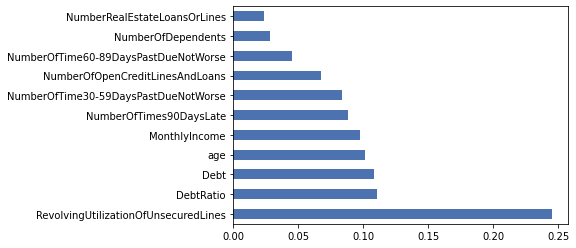

In [205]:
feat_importances = pd.Series(rf_clf.feature_importances_, index=X.columns)
feat_importances.nlargest(20).plot(kind='barh')

Comments: The most important features are:
1. RevolvingUtilizationOfUnsecuredLines
2. Debt/DebtRatio
3. age
4. NoOfTimesLate (for the different number of days)

Less important features:
1. NumberRealEstateLoansOrLines
2. NumberOfDependents

### Testing on a boosting model LightGBM that might produce better results and can also calculate feature importances

In [219]:
#converting the dataset into proper LGB format 
d_train=lgb.Dataset(X_train, label=y_train)
params={"early_stopping_rounds":30, 
            "metrics" : 'auc', 
            'verbose': 0}
cv_results = lgb.cv(params, d_train, num_boost_round=500, nfold=300)

/Users/alena/anaconda3/lib/python3.6/site-packages/lightgbm/engine.py:507: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


In [220]:
print('Current parameters:\n', params)
print('\nBest num_boost_round:', len(cv_results['auc-mean']))
print('Best CV score:', cv_results['auc-mean'][-1])

Current parameters:
 {'early_stopping_rounds': 30, 'metrics': 'auc', 'verbose': 0}

Best num_boost_round: 68
Best CV score: 0.8641687537270516


Based on the cross-validation on the training dataset, LightGBM is producing a much better result than the previous models.

In [285]:
y = df2['SeriousDlqin2yrs']
X = df2.drop(columns=["SeriousDlqin2yrs"])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)
lgb_clf = lgb.LGBMClassifier(num_boost_round=500, nfold=300, metrics= 'auc', verbose= -1, verbose_eval=False,  eval_metric='auc', early_stopping_rounds=30 )
lgb_clf.fit(X_train, y_train,eval_set=[(X_test,y_test)], verbose=False)

#prediction on the test set
pred=lr_clf.predict_proba(X_test)
roc_auc = roc_auc_score(y_test, pred[:, 1])
print(roc_auc)

/Users/alena/anaconda3/lib/python3.6/site-packages/lightgbm/engine.py:148: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))
/Users/alena/anaconda3/lib/python3.6/site-packages/lightgbm/engine.py:153: UserWarning: Found `early_stopping_rounds` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


0.8149114993125874


Comment: It seems that LightGBM did not work as well on the test dataset, however, given that it worked well for the training dataset, we will try to fine tune it.

### Feature importances for LightGBM

<AxesSubplot:>

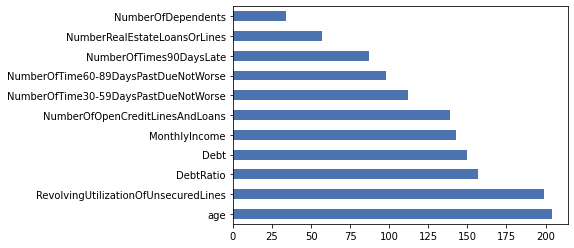

In [286]:
feat_importances = pd.Series(lgb_clf.feature_importances_, index=X.columns)
feat_importances.nlargest(20).plot(kind='barh')

Comments: The most important features are:
1. age
2. RevolvingUtilizationOfUnsecuredLines
3. Debt/DebtRatio

Less important features:
1. NumberOfDependents
2. NumberRealEstateLoansOrLines

This is quite similar to the results obtained for the random forest model, albeit slight shifts in ranking.